# STEPP zero-shot evaluation on RELLIS-3D (Step 2)

Run the authors' **pretrained** checkpoints on RELLIS-3D images (no fine-tuning, no odometry)
and measure how well STEPP's learned traversability transfers to this new domain, scored
against RELLIS's semantic labels.

Pipeline per image (faithful to `STEPP/utils/testing.py`, `mode='segment_wise'`):
image → resize 700×700 → DINOv2 `vits14` dense features (50×50×384) → SLIC superpixels →
average one 384-d feature per segment → pretrained MLP autoencoder → per-segment MSE
reconstruction error (**high error = unfamiliar = untraversable**) → full-res cost map.

Ground truth: `pylon_camera_node_label_id` mapped to traversable / non-traversable / ignore.

**Deviations from the repo (documented):** DINOv2 is loaded directly via `torch.hub` and SLIC
uses `skimage` (the repo's `fast_slic` needs a Windows wheel; same params `n_segments=400,
compactness=15`). The MLP architecture/weights are the repo's exactly. Validated end-to-end:
the forest checkpoint puts low cost on the dirt track/grass and high cost on sky/trees/people.

## 0. Config

In [1]:
from pathlib import Path

DATA_ROOT = Path('s:/#UNIVERSITY/Capstone/Code/Rellis_Stepp/Rellis_3D')
REPO_DIR  = Path('S:/GIT/STEPP_UnitreeGo2/STEPP_Code_Main')
OUT_DIR   = Path('s:/#UNIVERSITY/Capstone/Code/Rellis_Stepp/outputs/zero_shot_eval')

# pretrained checkpoints to evaluate (name -> file). Comment any out to skip.
CKPT_DIR = REPO_DIR / 'checkpoints'
CHECKPOINTS = {
    'richmond_forest': CKPT_DIR / 'richmond_forest_full_ViT_small_big_nn_checkpoint_20240821-1825.pth',
    'all_data':        CKPT_DIR / 'all_ViT_small_input_700_big_nn_checkpoint_20240827-1935.pth',
    # 'unreal':        CKPT_DIR / 'unreal_full_ViT_small_big_nn_checkpoint_20240819-2003.pth',
}

SEQS        = ['00000']   # sequences to evaluate on (only labeled frames are used)
EVAL_EVERY  = 5           # use every Nth labeled frame (1 = all; 1200 labeled frames in 00000)
N_QUALITATIVE = 6         # number of qualitative overlay images saved per checkpoint

# inference settings (match the repo)
INPUT_SIZE   = 700
PATCH        = 14
FEAT         = INPUT_SIZE // PATCH      # 50
N_SEGMENTS   = 400
COMPACTNESS  = 15
COST_CAP     = 10.0                     # paper caps reconstruction loss at 10
PAPER_THRESH = 0.35                     # paper threshold on cost/COST_CAP -> cost units = 3.5

# RELLIS label-id ontology (verify with np.unique on actual labels in section 2)
TRAVERSABLE = {1, 3, 10, 23, 33, 31}    # dirt, grass, asphalt, concrete, mud, puddle
IGNORE      = {0, 7}                    # void, sky
# everything else (tree, pole, water, vehicle, object, building, log, person, fence, bush, barrier, rubble) = non-traversable
PUDDLE_MUD_NOTE = 'puddle(31) & mud(33) counted as traversable (debatable) -- toggle in TRAVERSABLE above'

# cost histogram for memory-flat metrics (independent of #images / resolution)
N_BINS = 512

OUT_DIR.mkdir(parents=True, exist_ok=True)
print('checkpoints:', list(CHECKPOINTS))
for n, p in CHECKPOINTS.items():
    assert p.is_file(), f'missing checkpoint {n}: {p}'
assert REPO_DIR.is_dir() and DATA_ROOT.is_dir()

checkpoints: ['richmond_forest', 'all_data']


## 1. Load models — DINOv2 backbone + pretrained MLP autoencoder

In [2]:
import warnings, json, time
warnings.filterwarnings('ignore')
import numpy as np
import cv2
import torch
import torch.nn as nn
from torchvision import transforms as T
from skimage.segmentation import slic as sk_slic
import matplotlib.pyplot as plt
try:
    from tqdm.auto import tqdm
except ImportError:
    tqdm = lambda x, **k: x

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('device:', device)

# --- MLP: identical to STEPP/model/mlp.py ReconstructMLP, 'big_nn' hidden dims ---
class ReconstructMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super().__init__()
        out = input_dim
        layers = []
        for hd in hidden_dim:
            layers += [nn.Linear(input_dim, hd), nn.ReLU()]
            input_dim = hd
        layers.append(nn.Linear(input_dim, out))
        self.model = nn.Sequential(*layers)
    def forward(self, x):
        return self.model(x)

BIG_NN = [256, 128, 64, 32, 64, 128, 256]

def load_mlp(path):
    m = ReconstructMLP(384, BIG_NN).to(device)
    m.load_state_dict(torch.load(path, map_location=device))
    m.eval()
    return m

# --- DINOv2 vits14 via torch.hub (same model the repo's Dinov2ViT loads) ---
dino = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14', verbose=False).to(device).eval()
for p in dino.parameters():
    p.requires_grad = False
_normalize = T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # ImageNet stats (repo default)

@torch.no_grad()
def dino_features(rgb_square_uint8):
    """700x700 RGB uint8 -> (384, 50, 50) dense feature map."""
    t = torch.from_numpy(rgb_square_uint8).permute(2, 0, 1).float() / 255.0
    t = _normalize(t)[None].to(device)
    feat = dino.get_intermediate_layers(t)[0]                 # (1, 2500, 384)
    feat = feat.reshape(1, FEAT, FEAT, -1).permute(0, 3, 1, 2)
    return feat[0]                                            # (384, 50, 50)

print('models ready; MLP params:', sum(p.numel() for p in load_mlp(next(iter(CHECKPOINTS.values()))).parameters()))

device: cuda
models ready; MLP params: 283936


## 2. Match images to labels (only labeled frames are evaluable)

In [3]:
def labeled_frames(seq):
    img_dir = DATA_ROOT / seq / 'pylon_camera_node'
    lbl_dir = DATA_ROOT / seq / 'pylon_camera_node_label_id'
    pairs = []
    for img in sorted(img_dir.glob('*.jpg')):
        lbl = lbl_dir / (img.stem + '.png')
        if lbl.is_file():
            pairs.append((img, lbl))
    return pairs

eval_pairs = []
for seq in SEQS:
    p = labeled_frames(seq)
    eval_pairs += p[::EVAL_EVERY]
    print(f'seq {seq}: {len(p)} labeled frames -> {len(p[::EVAL_EVERY])} sampled (every {EVAL_EVERY})')
print('total eval frames:', len(eval_pairs))

# sanity: confirm the ontology covers the label IDs actually present
present = set()
for _, lbl in eval_pairs[::max(1, len(eval_pairs)//30)]:
    present |= set(np.unique(cv2.imread(str(lbl), cv2.IMREAD_UNCHANGED)).tolist())
nontrav = present - TRAVERSABLE - IGNORE
print('label IDs present:', sorted(present))
print('  -> traversable :', sorted(present & TRAVERSABLE))
print('  -> non-trav    :', sorted(nontrav))
print('  -> ignore      :', sorted(present & IGNORE))

seq 00000: 1200 labeled frames -> 240 sampled (every 5)
total eval frames: 240
label IDs present: [3, 4, 7, 8, 9, 12, 17, 18, 19, 31, 33, 34]
  -> traversable : [3, 31, 33]
  -> non-trav    : [4, 8, 9, 12, 17, 18, 19, 34]
  -> ignore      : [7]


## 3. Inference + ground-truth helpers

`cost_map(img, mlp)` reproduces the repo's segment-wise inference and returns a **raw**
(un-normalized) reconstruction-error map at the original image resolution. `gt_mask(label)`
returns 1 = traversable, 0 = non-traversable, 255 = ignore.

In [4]:
loss_fn = nn.MSELoss(reduction='none')

@torch.no_grad()
def cost_map(bgr, mlp):
    H, W = bgr.shape[:2]
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    sq  = cv2.resize(rgb, (INPUT_SIZE, INPUT_SIZE))               # squish to square (repo behaviour)
    feats = dino_features(sq)                                     # (384, 50, 50)
    seg = sk_slic(sq, n_segments=N_SEGMENTS, compactness=COMPACTNESS,
                  start_label=0, channel_axis=-1)                 # (700, 700)
    seg_small = cv2.resize(seg.astype(np.int32), (FEAT, FEAT), interpolation=cv2.INTER_NEAREST)
    ids = np.unique(seg_small)
    vecs = torch.stack([feats[:, seg_small == s].mean(dim=1) for s in ids])  # (n_seg, 384)
    rec = mlp(vecs)
    err = loss_fn(vecs, rec).mean(dim=1).cpu().numpy()            # per-segment MSE
    cost = np.zeros((INPUT_SIZE, INPUT_SIZE), np.float32)
    for s, e in zip(ids, err):
        cost[seg == s] = e
    return cv2.resize(cost, (W, H))                              # back to original resolution

def gt_mask(label_u8):
    gt = np.full(label_u8.shape, 255, np.uint8)                  # 255 = ignore
    trav = np.isin(label_u8, list(TRAVERSABLE))
    ign  = np.isin(label_u8, list(IGNORE))
    gt[~ign] = 0                                                 # non-traversable
    gt[trav] = 1                                                 # traversable
    gt[ign]  = 255
    return gt

## 4. Run inference & accumulate cost-vs-label histograms

Instead of storing every pixel, we accumulate two histograms of cost (traversable vs
non-traversable pixels). Every threshold-based metric (accuracy, IoU, precision/recall,
PR/ROC) is then computed from these histograms — memory stays flat regardless of how many
images or what resolution we evaluate.

In [5]:
bin_edges = np.linspace(0, COST_CAP, N_BINS + 1)

def accumulate(mlp):
    h_trav = np.zeros(N_BINS, np.int64)
    h_non  = np.zeros(N_BINS, np.int64)
    for img_p, lbl_p in tqdm(eval_pairs):
        bgr = cv2.imread(str(img_p)); assert bgr is not None, img_p
        gt  = gt_mask(cv2.imread(str(lbl_p), cv2.IMREAD_UNCHANGED))
        cost = np.clip(cost_map(bgr, mlp), 0, COST_CAP)
        h_trav += np.histogram(cost[gt == 1], bins=bin_edges)[0]
        h_non  += np.histogram(cost[gt == 0], bins=bin_edges)[0]
    return h_trav, h_non

hists = {}
for name, path in CHECKPOINTS.items():
    print(f'\n=== {name} ===')
    t0 = time.time()
    hists[name] = accumulate(load_mlp(path))
    print(f'{name}: done in {time.time()-t0:.0f}s')


=== richmond_forest ===


100%|██████████| 240/240 [02:25<00:00,  1.65it/s]


richmond_forest: done in 145s

=== all_data ===


100%|██████████| 240/240 [02:18<00:00,  1.73it/s]

all_data: done in 139s


## 5. Metrics

Predicted traversable = `cost < threshold`. Because the absolute cost scale of a zero-shot
model is arbitrary, the headline numbers are the **threshold-free** ROC-AUC and average
precision; we also report the **best-threshold** accuracy/IoU (an oracle upper bound, as the
paper tuned the threshold per dataset) and the fixed **paper threshold (0.35 → cost 3.5)**.

In [6]:
centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

def metrics_from_hist(h_trav, h_non):
    P = h_trav.sum(); N = h_non.sum(); tot = P + N
    # threshold at each bin edge k: predict traversable where cost < edge -> cumulative over bins
    c_trav = np.concatenate([[0], np.cumsum(h_trav)])   # TP at edge k
    c_non  = np.concatenate([[0], np.cumsum(h_non)])    # FP at edge k
    TP = c_trav; FP = c_non; FN = P - TP; TN = N - FP
    with np.errstate(divide='ignore', invalid='ignore'):
        acc  = (TP + TN) / tot
        iou  = TP / (TP + FP + FN)
        prec = np.where(TP + FP > 0, TP / (TP + FP), 1.0)
        rec  = np.where(P > 0, TP / P, 0.0)
        fpr  = np.where(N > 0, FP / N, 0.0)
    f1 = np.where(prec + rec > 0, 2 * prec * rec / (prec + rec), 0.0)
    roc_auc = float(np.trapz(rec, fpr))                 # rec=TPR vs FPR, both increasing in threshold
    ap = float(np.trapz(prec, rec))                     # AP = area under precision-recall (recall increases with threshold)
    best_acc = int(np.nanargmax(acc)); best_iou = int(np.nanargmax(iou))
    pidx = int(np.searchsorted(bin_edges, PAPER_THRESH * COST_CAP))
    return dict(roc_auc=roc_auc, ap=ap,
                trav_frac=float(P / tot),
                best_acc=float(acc[best_acc]), best_acc_thr=float(bin_edges[best_acc]),
                best_iou=float(iou[best_iou]), best_iou_thr=float(bin_edges[best_iou]),
                paper_acc=float(acc[pidx]), paper_iou=float(iou[pidx]),
                paper_prec=float(prec[pidx]), paper_rec=float(rec[pidx]),
                _curves=dict(prec=prec, rec=rec, fpr=fpr, acc=acc, iou=iou, f1=f1, edges=bin_edges))

results = {n: metrics_from_hist(*h) for n, h in hists.items()}

hdr = f"{'checkpoint':<16}{'ROC-AUC':>9}{'AP':>8}{'bestAcc':>9}{'@thr':>7}{'bestIoU':>9}{'@thr':>7}{'IoU@.35':>9}{'Acc@.35':>9}"
print(hdr); print('-' * len(hdr))
for n, r in results.items():
    print(f"{n:<16}{r['roc_auc']:>9.3f}{r['ap']:>8.3f}{r['best_acc']:>9.3f}{r['best_acc_thr']:>7.2f}"
          f"{r['best_iou']:>9.3f}{r['best_iou_thr']:>7.2f}{r['paper_iou']:>9.3f}{r['paper_acc']:>9.3f}")
print('\ntraversable pixel fraction (class balance):', {n: round(r['trav_frac'], 3) for n, r in results.items()})
print(PUDDLE_MUD_NOTE)

checkpoint        ROC-AUC      AP  bestAcc   @thr  bestIoU   @thr  IoU@.35  Acc@.35
-----------------------------------------------------------------------------------
richmond_forest     0.965   0.947    0.906   2.56    0.815   2.58    0.775    0.874
all_data            0.959   0.941    0.893   2.17    0.792   2.29    0.702    0.815

traversable pixel fraction (class balance): {'richmond_forest': 0.439, 'all_data': 0.439}
puddle(31) & mud(33) counted as traversable (debatable) -- toggle in TRAVERSABLE above


## 6. Curves: PR, ROC, and threshold sweeps

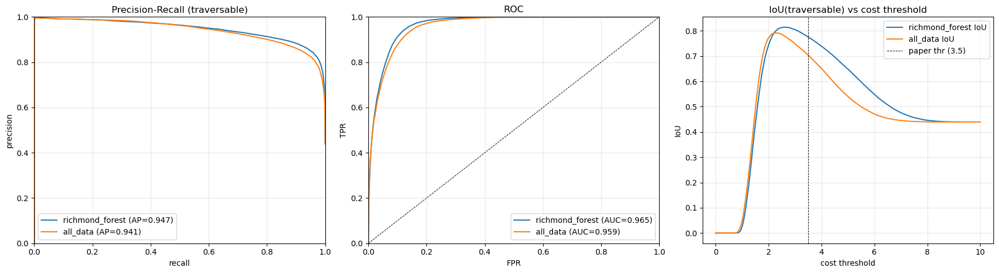

In [7]:
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
for n, r in results.items():
    c = r['_curves']
    ax[0].plot(c['rec'], c['prec'], label=f"{n} (AP={r['ap']:.3f})")
    ax[1].plot(c['fpr'], c['rec'], label=f"{n} (AUC={r['roc_auc']:.3f})")
    ax[2].plot(c['edges'], c['iou'], label=f'{n} IoU')
ax[0].set(title='Precision-Recall (traversable)', xlabel='recall', ylabel='precision', xlim=(0,1), ylim=(0,1))
ax[1].plot([0,1],[0,1],'k--',lw=0.7); ax[1].set(title='ROC', xlabel='FPR', ylabel='TPR', xlim=(0,1), ylim=(0,1))
ax[2].axvline(PAPER_THRESH*COST_CAP, color='k', ls='--', lw=0.7, label='paper thr (3.5)')
ax[2].set(title='IoU(traversable) vs cost threshold', xlabel='cost threshold', ylabel='IoU')
for a in ax: a.legend(); a.grid(alpha=0.3)
plt.tight_layout(); plt.savefig(OUT_DIR / 'curves.png', dpi=120); plt.show()

## 7. Qualitative overlays (cost heatmap + GT traversable on RGB)

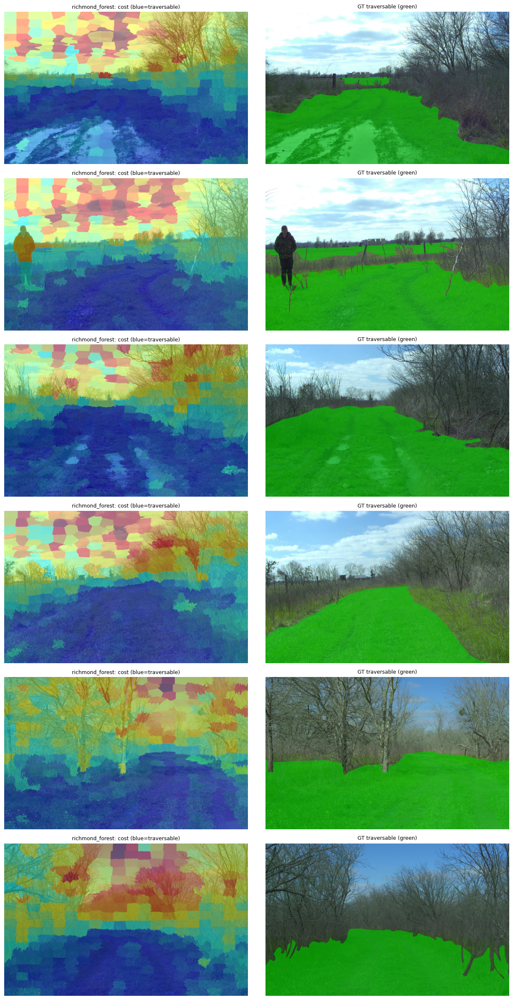

saved overlays -> s:\#UNIVERSITY\Capstone\Code\Rellis_Stepp\outputs\zero_shot_eval\richmond_forest


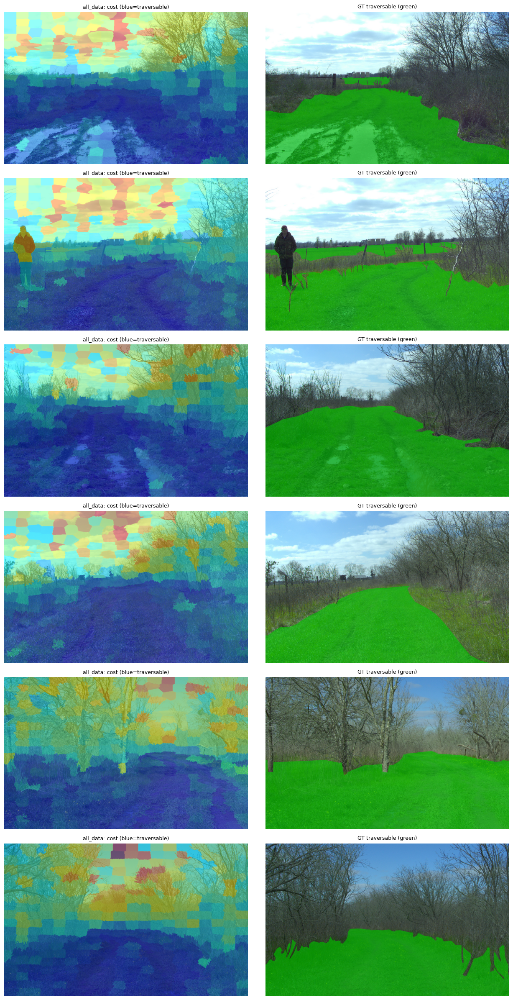

saved overlays -> s:\#UNIVERSITY\Capstone\Code\Rellis_Stepp\outputs\zero_shot_eval\all_data


In [8]:
def heatmap_overlay(bgr, cost):
    cn = np.clip(cost, 0, COST_CAP) / COST_CAP
    heat = cv2.applyColorMap((cn * 255).astype(np.uint8), cv2.COLORMAP_JET)
    return cv2.addWeighted(bgr, 0.55, heat, 0.45, 0)

sample = eval_pairs[::max(1, len(eval_pairs) // N_QUALITATIVE)][:N_QUALITATIVE]
for name, path in CHECKPOINTS.items():
    mlp = load_mlp(path)
    qdir = OUT_DIR / name; qdir.mkdir(parents=True, exist_ok=True)
    fig, axes = plt.subplots(len(sample), 2, figsize=(13, 4 * len(sample)))
    for row, (img_p, lbl_p) in zip(axes, sample):
        bgr = cv2.imread(str(img_p))
        cost = cost_map(bgr, mlp)
        over = heatmap_overlay(bgr, cost)
        cv2.imwrite(str(qdir / img_p.name), over)
        gt = gt_mask(cv2.imread(str(lbl_p), cv2.IMREAD_UNCHANGED))
        gt_vis = cv2.cvtColor(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB), cv2.COLOR_RGB2BGR).copy()
        gt_vis[gt == 1] = (0.4 * gt_vis[gt == 1] + 0.6 * np.array([0, 200, 0])).astype(np.uint8)
        row[0].imshow(cv2.cvtColor(over, cv2.COLOR_BGR2RGB)); row[0].set_title(f'{name}: cost (blue=traversable)', fontsize=9)
        row[1].imshow(cv2.cvtColor(gt_vis, cv2.COLOR_BGR2RGB)); row[1].set_title('GT traversable (green)', fontsize=9)
        row[0].axis('off'); row[1].axis('off')
    plt.tight_layout(); plt.show()
    print('saved overlays ->', qdir)

## 8. Save metrics

In [9]:
summary = {
    'sequences': SEQS, 'eval_every': EVAL_EVERY, 'n_frames': len(eval_pairs),
    'input_size': INPUT_SIZE, 'n_segments': N_SEGMENTS, 'compactness': COMPACTNESS,
    'cost_cap': COST_CAP, 'paper_threshold': PAPER_THRESH,
    'traversable_ids': sorted(TRAVERSABLE), 'ignore_ids': sorted(IGNORE),
    'slic': 'skimage (fast_slic unavailable on Windows)',
    'results': {n: {k: v for k, v in r.items() if k != '_curves'} for n, r in results.items()},
}
with open(OUT_DIR / 'metrics.json', 'w') as f:
    json.dump(summary, f, indent=2)
print('wrote', OUT_DIR / 'metrics.json')
print(json.dumps(summary['results'], indent=2))

wrote s:\#UNIVERSITY\Capstone\Code\Rellis_Stepp\outputs\zero_shot_eval\metrics.json
{
  "richmond_forest": {
    "roc_auc": 0.9648489423455323,
    "ap": 0.9470290792532667,
    "trav_frac": 0.4393816339586121,
    "best_acc": 0.9062498062232329,
    "best_acc_thr": 2.55859375,
    "best_iou": 0.8145836464973572,
    "best_iou_thr": 2.578125,
    "paper_acc": 0.8739159566769409,
    "paper_iou": 0.7746172849170428,
    "paper_prec": 0.7830772434385663,
    "paper_rec": 0.9862449791827158
  },
  "all_data": {
    "roc_auc": 0.9589284831361353,
    "ap": 0.9408714507514102,
    "trav_frac": 0.4393816339586121,
    "best_acc": 0.8933270868887317,
    "best_acc_thr": 2.16796875,
    "best_iou": 0.7919161393438422,
    "best_iou_thr": 2.28515625,
    "paper_acc": 0.8150210717106422,
    "paper_iou": 0.7020123363742391,
    "paper_prec": 0.706107527683323,
    "paper_rec": 0.9918061987075115
  }
}
